## 2025-03-03: Cropping Dorsal-Palm Region of Hand

### Authors
* Nicole Tin (nicole@velexi.com)




### Experiment Parameters

In [1]:
# --- Experiment parameters

# Paths
root = '/Users/ntin/Documents/DermaML_local/hawkeye-hands-2024-07-29'

image_folder = '/images_processed/'
features_folder = '/features-2025-02-24/'
segmentation_folder = '/segmentations_npys/'
csv_file = '/metadata.csv'

### Preparations

In [2]:
# --- Imports

# Internal library
from dermaml.data import read_local_into_lists

# Standard library
import random 
import math
import os
from datetime import datetime
# External packages
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import mediapipe as mp
import pandas as pd

# Entropy
random.seed(42)
np.random.seed(42)

np.set_printoptions(precision=3, suppress=True)

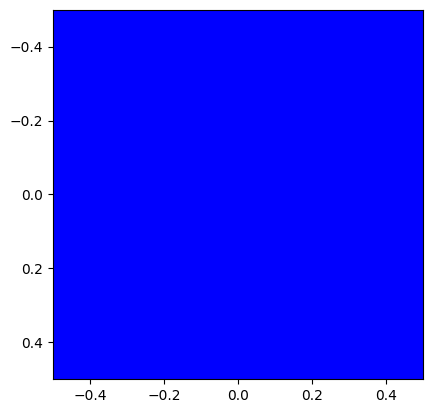

In [5]:
plt.imshow([[[0,0,255]]])

In [3]:
metadata_processed = pd.read_csv(root + '/metadata_processed.csv')
metadata = metadata_processed.loc[:, metadata_processed.columns[-7:]]

def read_segmentation(fname):
    """Read segmentation numpy array file."""
    segmentation_folder = '/segmentations_npys/'
    path = os.path.join(root + segmentation_folder, fname)
    if not os.path.exists(path):
        raise FileNotFoundError(f"Segmentation file {fname} not found at {path}.")
    return np.load(path, allow_pickle=True)

### Read Images

In [4]:
samples, hawkeye_filenames = read_local_into_lists(root+image_folder)
image_count = len(hawkeye_filenames)

100%|██████████| 628/628 [00:00<00:00, 5356.17it/s]


In [5]:
def extract_and_crop_dorsal_hand_region(image):
    """
    Extracts and crops the dorsal hand region (above the wrist, including more of the back of the hand, excluding fingers).
    Args:
        image (np.ndarray): Input BGR image.
    Returns:
        cropped_dorsal (np.ndarray): Cropped image of the dorsal hand region.
        dorsal_polygon (list): List of (x, y) tuples for the dorsal hand polygon.
    """

    mp_hands = mp.solutions.hands
    with mp_hands.Hands(
        static_image_mode=True,
        max_num_hands=1,
        model_complexity=1,
        min_detection_confidence=0.3,
    ) as hands:
        # results = hands.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        results = hands.process(image)
        if not results.multi_hand_landmarks:
            print("No hands detected.")
            print(results)
            return None, None

        hand_landmarks = results.multi_hand_landmarks[0]
        h, w, _ = image.shape

        # Use more landmarks to expand the region
        dorsal_indices = [0, 1, 2, 5, 9, 13, 17]
        dorsal_polygon = [
            (int(hand_landmarks.landmark[i].x * w), int(hand_landmarks.landmark[i].y * h))
            for i in dorsal_indices
        ]

        # Create mask
        mask = np.zeros_like(image)
        cv.fillPoly(mask, [np.array(dorsal_polygon, dtype=np.int32)], (255, 255, 255))

        # Apply mask
        dorsal_masked = cv.bitwise_and(image, mask)

        # Crop to bounding box of polygon
        xs, ys = zip(*dorsal_polygon)
        x_min, x_max = max(min(xs), 0), min(max(xs), w)
        y_min, y_max = max(min(ys), 0), min(max(ys), h)
        cropped_dorsal = dorsal_masked[y_min:y_max, x_min:x_max]

        return cropped_dorsal, dorsal_polygon

I0000 00:00:1753659400.955515 2739656 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1753659400.961944 2739897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753659400.965930 2739897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


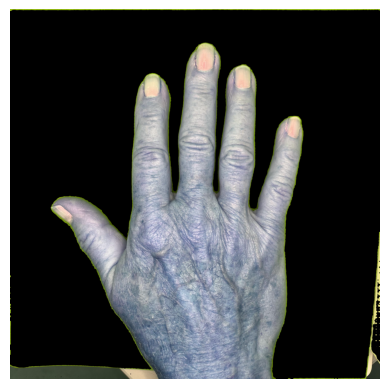

In [6]:
# ...existing code...
image_file = root + image_folder + 'f662d0e8-af3e-46ff-b7c4-7a6f3a9a4cda.jpeg'
image = cv.imread(image_file)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

mask = read_segmentation("f662d0e8-af3e-46ff-b7c4-7a6f3a9a4cda.npy")
masked_image = np.where(mask[:, :, np.newaxis], image, 0)

palm_img, palm_poly = extract_and_crop_dorsal_hand_region(masked_image)
if palm_img is not None:
    plt.imshow(palm_img[:,:,::-1]); plt.axis('off'); plt.show()

if palm_img is None:
    # Display the cropped dorsal hand region
    plt.imshow(masked_image[:,:,::-1]); plt.axis('off'); plt.show()
# ...existing code...

I0000 00:00:1753651932.109917  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651932.122088 2662314 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651932.127396 2662318 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651932.353568  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651932.357478 2662327 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651932.362472 2662329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651932.643483  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


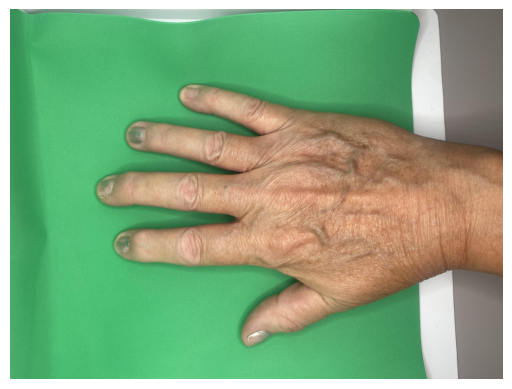

No dorsal hand region detected in cda06ee0-7c4b-4a7c-9007-36e2011f7918.


I0000 00:00:1753651933.293813  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651933.297983 2662357 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651933.302721 2662357 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


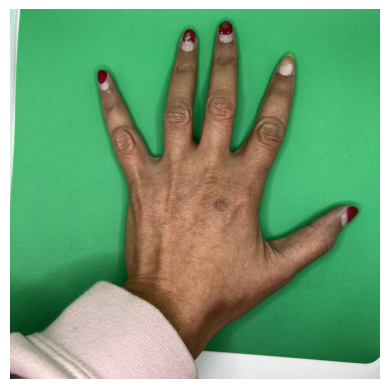

No dorsal hand region detected in a11149e5-30ff-461b-b53f-17576b5317dc.


I0000 00:00:1753651933.851650  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651933.855727 2662375 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651933.861156 2662377 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


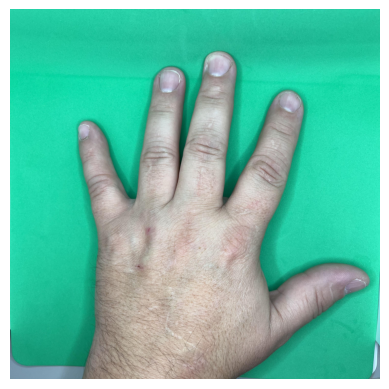

No dorsal hand region detected in 9daa575c-67cb-4d1b-922c-cfdb7076842e.


I0000 00:00:1753651934.390500  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651934.395059 2662446 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651934.399180 2662450 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651934.626182  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651934.630491 2662462 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651934.635130 2662462 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


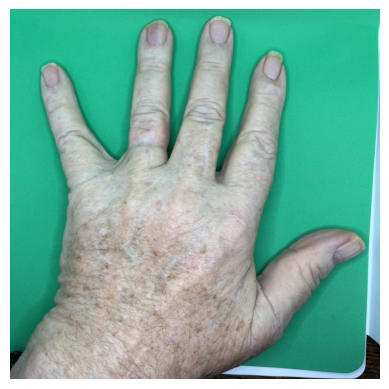

No dorsal hand region detected in 4368529b-7fb6-4681-b187-2c278caa070d.


I0000 00:00:1753651935.242904  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651935.248286 2662482 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651935.252045 2662484 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


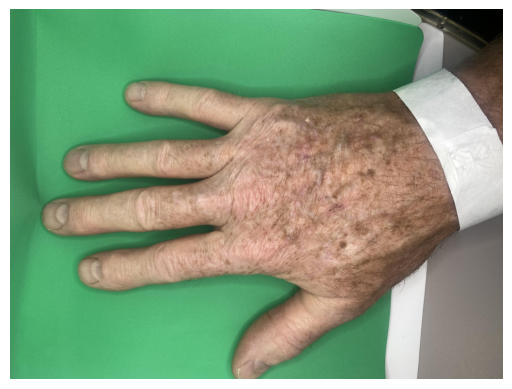

No dorsal hand region detected in 8fb295e1-6c0a-4168-8e96-7661b7aeefeb.


I0000 00:00:1753651935.953784  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651935.958752 2662503 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651935.962241 2662503 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


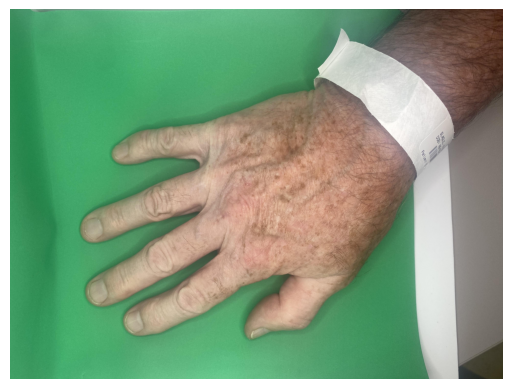

No dorsal hand region detected in 305d66f2-31ff-42f1-b98a-9eec92b05102.
No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


I0000 00:00:1753651936.570887  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651936.575680 2662528 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651936.578964 2662528 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


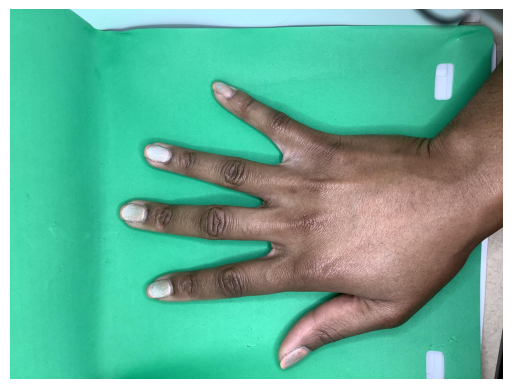

No dorsal hand region detected in f0a27f90-a223-4e71-8330-ba126ac9c428.


I0000 00:00:1753651937.085246  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651937.090836 2662545 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651937.094583 2662545 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


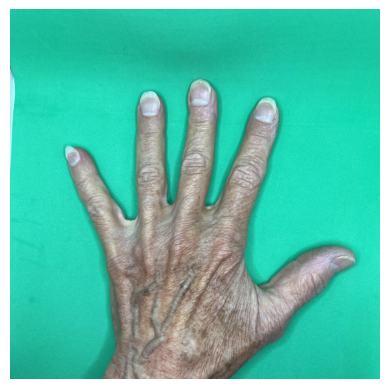

No dorsal hand region detected in 300cb2aa-2d56-4f90-b0e1-3cac8a9f344f.


I0000 00:00:1753651937.699409  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651937.703631 2662560 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651937.706674 2662560 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651938.002308  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651938.007000 2662577 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651938.010475 2662577 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651938.242765  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


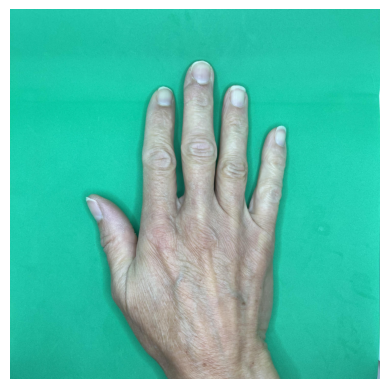

No dorsal hand region detected in c12602c9-49dd-41b8-b284-6723aaa584ca.


I0000 00:00:1753651939.875792  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651939.879581 2662677 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651939.883279 2662677 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651940.166550  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651940.170512 2662690 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651940.174451 2662692 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651940.460514  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


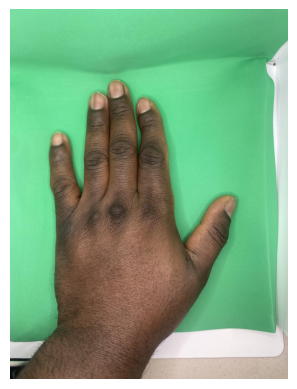

No dorsal hand region detected in c1ba3e1f-e3c6-4f58-b582-9b642b9e4d8d.


I0000 00:00:1753651941.118110  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651941.122053 2662735 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651941.125425 2662738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651941.420675  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651941.425764 2662747 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651941.428678 2662747 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651941.717963  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


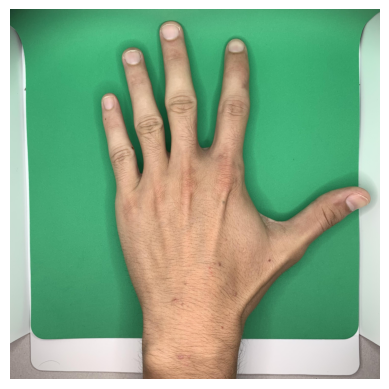

No dorsal hand region detected in 6efe0f96-198d-4b67-bf5d-67699778523f.


I0000 00:00:1753651943.967345  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651943.971945 2662894 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651943.975906 2662893 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


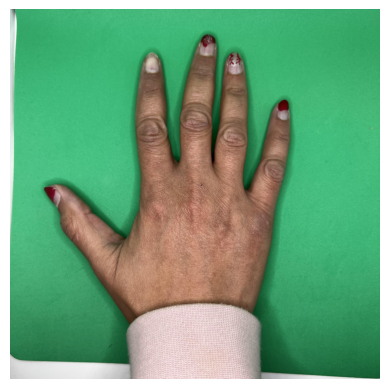

No dorsal hand region detected in c3476ff1-bcaf-43a9-86d9-20abaf619efa.


I0000 00:00:1753651944.576192  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651944.580102 2662915 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651944.583347 2662915 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651944.802716  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651944.807063 2662944 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651944.811269 2662944 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


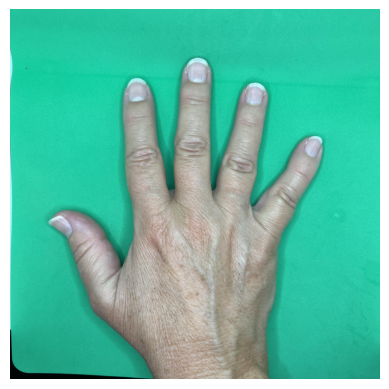

No dorsal hand region detected in aa70168a-5514-4330-b051-8c73e12968d1.


I0000 00:00:1753651945.342913  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651945.346973 2662972 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651945.350986 2662972 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


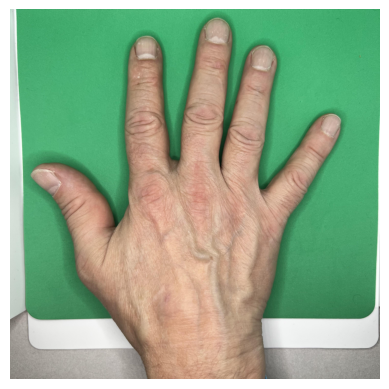

No dorsal hand region detected in 8ab909c8-19f7-4c03-8e7d-dbce128b6792.


I0000 00:00:1753651945.960214  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651945.964102 2662985 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651945.968027 2662985 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651946.260976  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651946.265483 2663005 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651946.268606 2663014 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


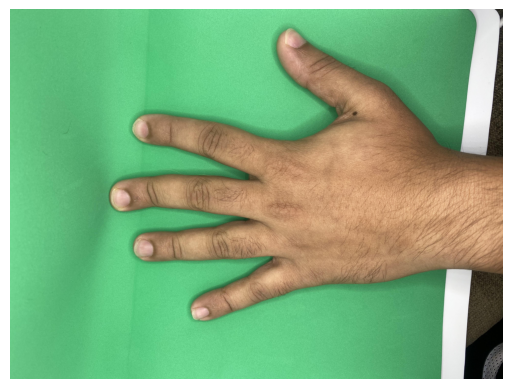

No dorsal hand region detected in dceef99c-8f70-4d7f-a13c-41b8696d09d6.


I0000 00:00:1753651946.876403  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651946.880870 2663026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651946.884142 2663027 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


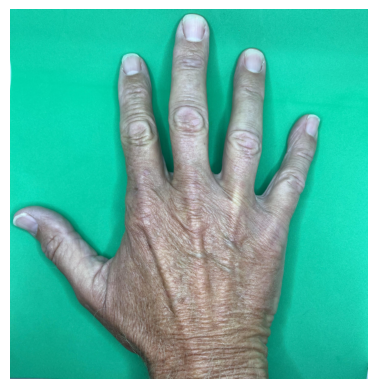

No dorsal hand region detected in eb365ac1-bccd-4060-9711-437db2cecfe3.


I0000 00:00:1753651947.503866  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651947.507801 2663060 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651947.510925 2663064 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


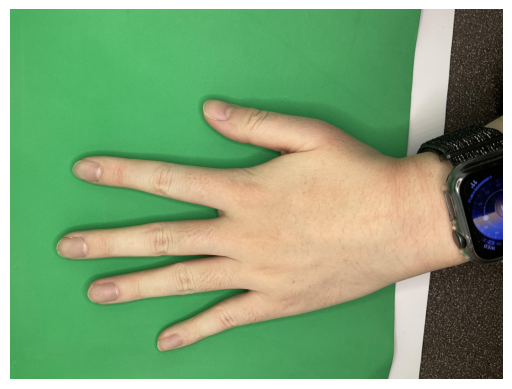

No dorsal hand region detected in d005437f-2e69-4c95-ad68-8e439a0ccc9e.


I0000 00:00:1753651948.143876  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651948.147953 2663077 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651948.152443 2663077 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651948.444184  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651948.448619 2663088 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651948.452147 2663088 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651948.643635  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


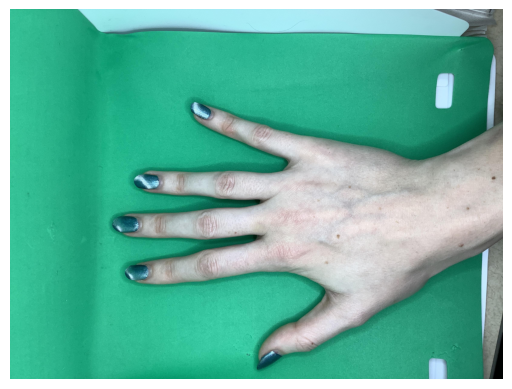

No dorsal hand region detected in f6d495b7-3588-4786-9bd9-620cae7fa6dc.


I0000 00:00:1753651949.225556  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651949.229635 2663116 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651949.232821 2663120 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651949.518976  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651949.524180 2663130 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651949.527427 2663134 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651949.808522  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


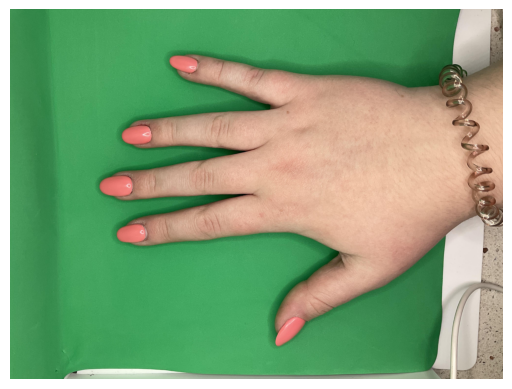

No dorsal hand region detected in c603146b-798a-4fd6-95fb-510dec2f3858.


I0000 00:00:1753651950.504153  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651950.509280 2663166 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651950.512460 2663166 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651950.793808  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651950.798145 2663180 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651950.801451 2663180 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651951.082298  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


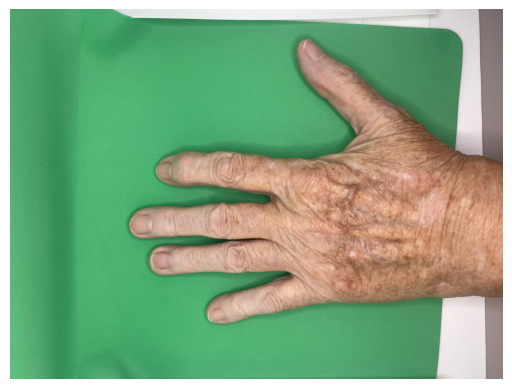

No dorsal hand region detected in 32aa758a-1649-4f2f-8194-3ad568a1c71d.


I0000 00:00:1753651952.367152  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651952.371226 2663243 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651952.374593 2663243 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651952.659834  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651952.664335 2663269 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651952.667445 2663269 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651952.945714  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


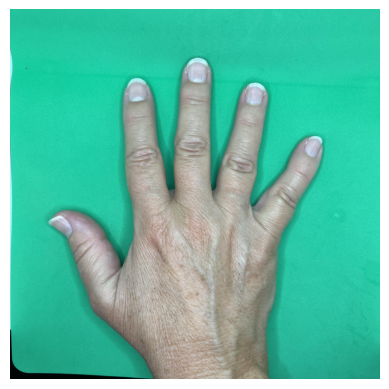

No dorsal hand region detected in bb388d7c-4c7f-4adb-89ac-0827cc305a60.


I0000 00:00:1753651953.777231  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651953.781419 2663336 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651953.784657 2663336 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651954.069228  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651954.073701 2663353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651954.077090 2663353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651954.360175  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


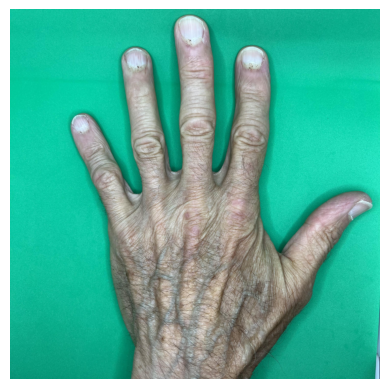

No dorsal hand region detected in 664e998a-0ec1-4afa-9ab2-dc1d8c42d837.


I0000 00:00:1753651955.207162  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651955.211608 2663404 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651955.214985 2663404 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651955.501030  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651955.505980 2663417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651955.509520 2663417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651955.800345  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


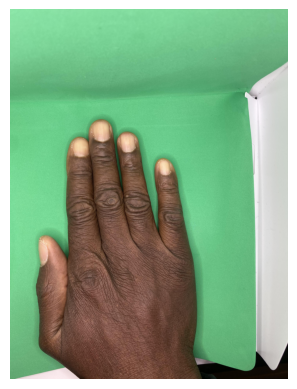

No dorsal hand region detected in a452acfd-913e-4209-b2b4-29bf7a2e8bb7.


I0000 00:00:1753651956.761470  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651956.765854 2663469 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651956.769178 2663471 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


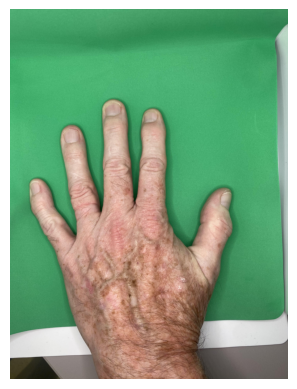

No dorsal hand region detected in 45e6c0c5-4338-4eff-997b-55b4ce3a56b3.


I0000 00:00:1753651957.377817  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651957.381845 2663488 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651957.385836 2663488 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651957.624772  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651957.628491 2663498 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651957.632230 2663498 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


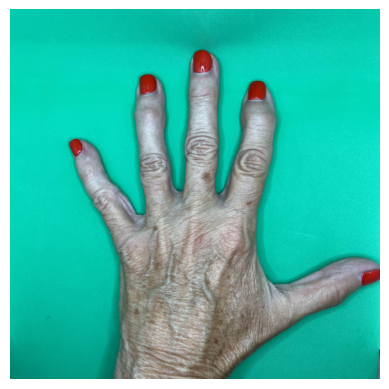

No dorsal hand region detected in 657dcd64-b56e-43e4-8d0c-d6d4b6bcb3f7.


I0000 00:00:1753651958.202257  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651958.206378 2663513 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651958.210369 2663513 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651958.440655  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651958.444566 2663530 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651958.449318 2663527 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651958.739757  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


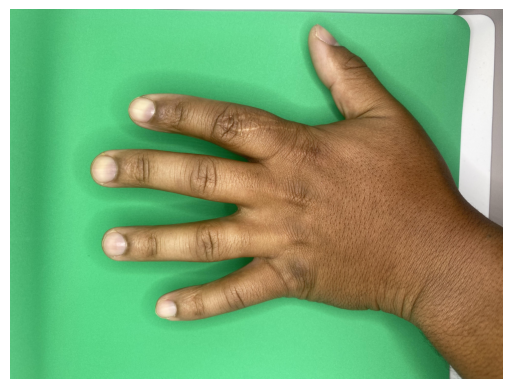

No dorsal hand region detected in db6d51b7-8514-46dc-b59b-e10a8dfe3d63.


I0000 00:00:1753651959.386754  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651959.390992 2663557 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651959.395328 2663558 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


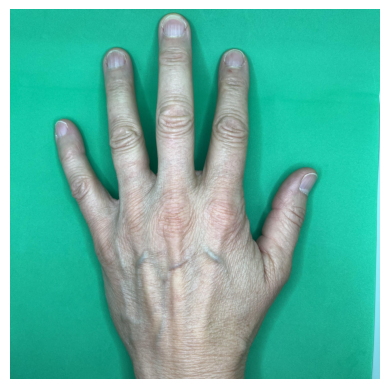

No dorsal hand region detected in ca31eb14-0efb-4f7c-8376-49903b989464.


I0000 00:00:1753651960.033624  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651960.037590 2663573 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651960.040680 2663573 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


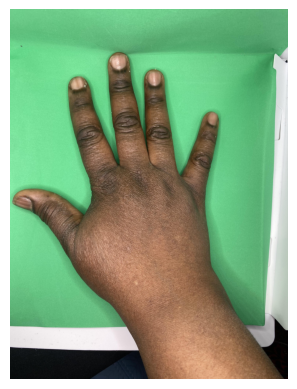

No dorsal hand region detected in e96ecf75-5ec0-4dda-9564-c851e3319e00.


I0000 00:00:1753651960.644856  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651960.649031 2663589 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651960.653616 2663596 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


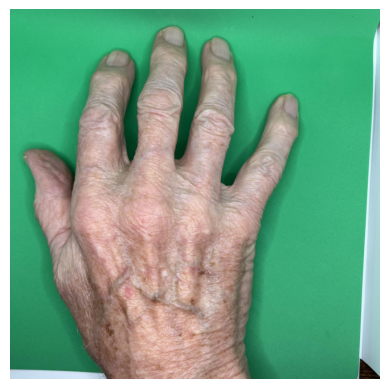

No dorsal hand region detected in a0d7c669-3803-4d2c-946d-06a5ae432995.


I0000 00:00:1753651961.268672  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651961.272914 2663602 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651961.276301 2663602 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651961.554035  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651961.559229 2663618 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651961.562364 2663618 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651961.852026  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


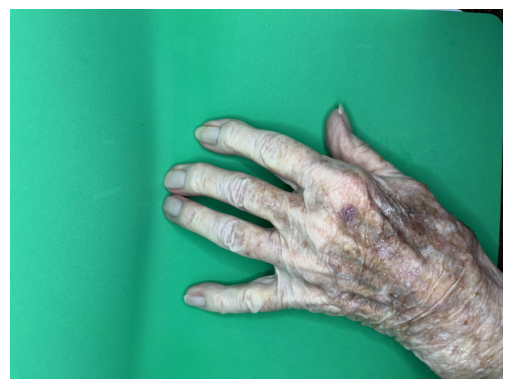

No dorsal hand region detected in 16b45eff-7f1d-4437-b8fa-c7d4adbf4f92.


I0000 00:00:1753651962.565705  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651962.570566 2663646 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651962.573873 2663646 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651962.808039  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651962.812839 2663659 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651962.818402 2663661 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


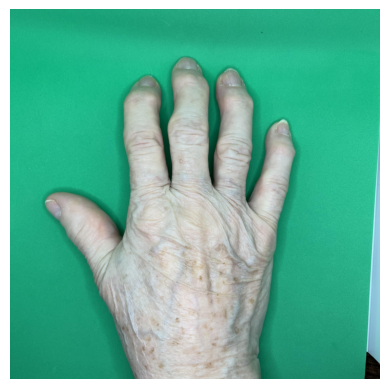

No dorsal hand region detected in e372cfe9-dbf4-4308-86ca-fd17547d6b51.


I0000 00:00:1753651963.415401  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651963.419614 2663699 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651963.422894 2663699 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651963.625119  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651963.629252 2663712 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651963.632859 2663712 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


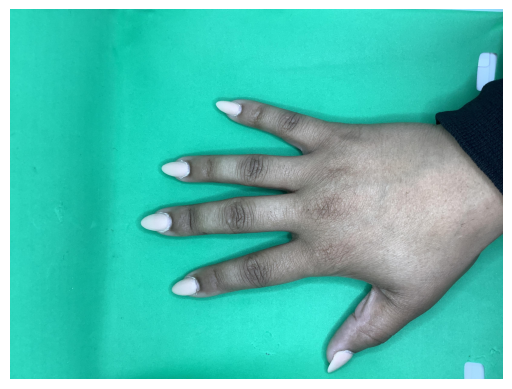

No dorsal hand region detected in f809f6dd-c71a-4e57-94a8-7469185157c7.


I0000 00:00:1753651964.225169  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651964.229059 2663728 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651964.232314 2663728 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


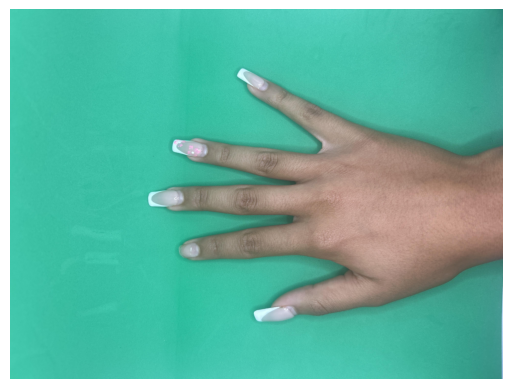

No dorsal hand region detected in 2128b88a-f0e5-4afa-9165-753ff6f47d51.


I0000 00:00:1753651964.895422  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651964.899595 2663764 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651964.903470 2663762 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


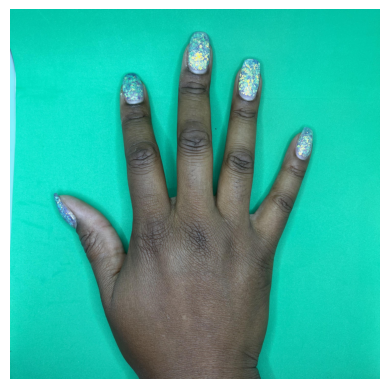

No dorsal hand region detected in 02fc0214-0731-47bf-a814-09448e600240.


I0000 00:00:1753651965.457964  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651965.461911 2663785 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651965.465921 2663782 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651965.767875  797728 gl_context.cc:369] GL version: 2.1 (2.1 Metal - 89.4), renderer: Apple M4 Pro
W0000 00:00:1753651965.771838 2663805 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1753651965.775992 2663805 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1753651966.070288  797728 gl

No hands detected.
<class 'mediapipe.python.solution_base.SolutionOutputs'>


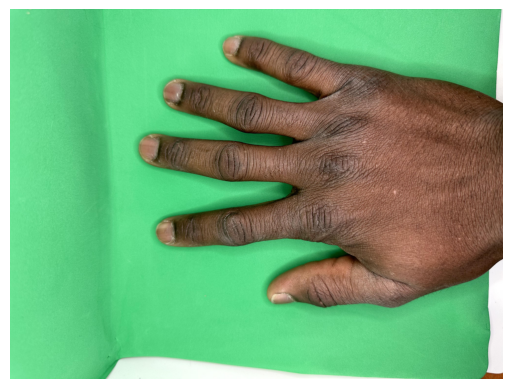

No dorsal hand region detected in 6dc26884-815c-4e6f-9f3c-c46a67452083.


[ WARN:0@522706.635] global loadsave.cpp:268 findDecoder imread_('/Users/ntin/Documents/DermaML_local/hawkeye-hands-2024-07-29/images_processed/.jpeg'): can't open/read file: check file path/integrity


error: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
completed = []
incomplete = []

for npy_file in os.listdir(root + segmentation_folder):
    image_file = npy_file.split('.')[0]
    if image_file in [
        "2c4bbea2-b78e-4379-9a5c-76d195ed8574", 
        "3aba178e-bd26-488b-94d5-4159a5339e66",
        ".DS_Store"
        ]:
        continue
    image_path = image_file + '.jpeg'  # Adjust if necessary
    read_path = os.path.join(root+image_folder, image_path)
    image = cv.imread(read_path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    
    mask = read_segmentation(npy_file)  # Adjust if necessary

    masked_image = np.where(mask[:, :, np.newaxis], image, 0)
    
    # Extract and crop the dorsal hand region
    dorsal_img, dorsal_poly = extract_and_crop_dorsal_hand_region(masked_image)
    
    if dorsal_img is None:
        # Display the cropped dorsal hand region
        plt.imshow(image); plt.axis('off'); plt.show()

        print(f"No dorsal hand region detected in {image_file}.")
        incomplete.append(image_file)
    
    if dorsal_img is not None:

        output_path = os.path.join('../data/processed/cropped_dorsals-2', image_path)
        cv.imwrite(output_path, dorsal_img)
        completed.append(image_file)


In [ ]:
len(completed), len(incomplete)

(0, 0)

In [12]:
def geometric_convex_defects(largest_contour, mask, image):
    """
    Extracts the dorsal region (palm) from a hand mask using convexity defects.
    Assumes the hand mask is already upright (rotation-corrected).

    Args:
        largest_contour (np.array): The largest contour of the hand mask.
        mask (np.array): The binary hand mask (e.g., rotated_full_hand_mask).
        image (np.array): The corresponding image (e.g., rotated_original_image).

    Returns:
        tuple: (dorsal_region_extracted, final_dorsal_mask) or (None, None) if no defects.
    """
    # Get convex hull indices and points
    hull_indices = cv.convexHull(largest_contour, returnPoints=False)
    hull_points = cv.convexHull(largest_contour, returnPoints=True)

    # Find convexity defects
    defects = cv.convexityDefects(largest_contour, hull_indices)

    # Initialize mask for the dorsal region
    dorsal_palm_mask = np.zeros_like(mask)

    if defects is not None and len(defects) > 0:
        # Filter and collect significant defect points (farthest points)
        # These are the "valleys" between fingers
        significant_defect_points = []
        min_defect_depth_threshold = 5000 # Tune this value based on your image scale
                                          # (d is distance * 256, so 5000/256 ~ 19.5 pixels)

        for i in range(defects.shape[0]):
            s, e, f, d = defects[i, 0] # start_idx, end_idx, farthest_idx, fixed_depth
            farthest_point = tuple(largest_contour[f][0])
            depth = d / 256.0 # Convert fixed-point to float pixel distance

            # Consider defects with sufficient depth
            if depth > min_defect_depth_threshold / 256.0:
                significant_defect_points.append(farthest_point)

        # Sort defect points by their x-coordinate to create a left-to-right order
        significant_defect_points = sorted(significant_defect_points, key=lambda p: p[0])

        # --- Define the "finger-base" line using defect points ---
        # This is the upper boundary of our dorsal palm mask.
        # If there are enough defects (e.g., 3-4 for 5 fingers), we can connect them.
        # If fewer, we might need to interpolate or use other heuristics.

        # For simplicity, let's try to connect the outermost significant defects
        # or use all of them if they form a reasonable line.
        
        palm_upper_boundary_points = []
        if len(significant_defect_points) >= 2:
            # Connect the outermost defects to form the top boundary of the palm
            palm_upper_boundary_points.append(significant_defect_points[0])
            # Add intermediate points if there are more defects
            if len(significant_defect_points) > 2:
                for j in range(1, len(significant_defect_points) - 1):
                    palm_upper_boundary_points.append(significant_defect_points[j])
            palm_upper_boundary_points.append(significant_defect_points[-1])
        elif len(significant_defect_points) == 1:
            # If only one defect, it's harder to define a line.
            # Fallback to a horizontal line based on its y-coordinate.
            palm_upper_boundary_points.append((0, significant_defect_points[0][1]))
            palm_upper_boundary_points.append((mask.shape[1], significant_defect_points[0][1]))
        else:
            # Not enough significant defects, fallback to a heuristic (e.g., 40% of height)
            x, y, w, h = cv.boundingRect(largest_contour)
            palm_upper_y = int(y + h * 0.4)
            palm_upper_boundary_points.append((x, palm_upper_y))
            palm_upper_boundary_points.append((x + w, palm_upper_y))

        # --- Define the "wrist-cut" line (lower boundary of the dorsal palm) ---
        # Find the lowest points of the hull or contour to define the wrist cut.
        # This part is still heuristic without anatomical landmarks.
        # Option A: Take the lowest points of the convex hull
        lowest_hull_y = np.max(hull_points[:,:,1])
        # Option B: Use a percentage of the hand's height from the bottom
        x, y, w, h = cv.boundingRect(largest_contour)
        wrist_cut_y = int(y + h * 0.85) # Still a heuristic percentage

        # Let's use the lower part of the convex hull as the base of the palm
        # Filter hull points to get those in the lower region
        lower_hull_points = [p[0] for p in hull_points if p[0][1] > wrist_cut_y - 20] # Adjust threshold
        if len(lower_hull_points) < 2:
            # Fallback if not enough lower hull points, use a simple horizontal line
            palm_lower_boundary_points = [(x, wrist_cut_y), (x + w, wrist_cut_y)]
        else:
            palm_lower_boundary_points = sorted(lower_hull_points, key=lambda p: p[0])

        # --- Construct the dorsal palm polygon ---
        # Combine upper boundary points (finger-base) and lower boundary points (wrist-cut)
        # Ensure the polygon is closed.
        dorsal_polygon_coords = np.array(
            palm_upper_boundary_points + palm_lower_boundary_points[::-1], # Reverse lower points to close polygon
            np.int32
        ).reshape((-1, 1, 2))

        # Create the mask for this polygon
        cv.fillPoly(dorsal_palm_mask, [dorsal_polygon_coords], 255)

        # Intersect the polygon mask with the original hand mask (rotated)
        final_dorsal_mask_geometric = cv.bitwise_and(mask, dorsal_palm_mask)

        dorsal_region_extracted_geometric = cv.bitwise_and(image, image, mask=final_dorsal_mask_geometric)

        return dorsal_region_extracted_geometric, final_dorsal_mask_geometric, dorsal_palm_mask,
    else:
        print("No significant convexity defects found for intelligent cropping. Consider adjusting min_defect_depth_threshold or using a fallback method.")
        # Fallback to the percentage method if no defects are found
        x, y, w, h = cv.boundingRect(largest_contour)
        finger_cutoff_y = int(y + h * 0.4)
        wrist_cutoff_y = int(y + h * 0.85)
        palm_rect_mask = np.zeros_like(mask)
        cv.rectangle(palm_rect_mask, (x, finger_cutoff_y), (x + w, wrist_cutoff_y), 255, -1)
        final_dorsal_mask_geometric = cv.bitwise_and(mask, palm_rect_mask)
        dorsal_region_extracted_geometric = cv.bitwise_and(image, image, mask=final_dorsal_mask_geometric)
        return dorsal_region_extracted_geometric, final_dorsal_mask_geometric, palm_rect_mask,

In [13]:

def straighten_rotated_image(image, mask, cnt):
    # Get the rotated bounding box
    rect = cv.minAreaRect(cnt)
    (center_x, center_y), (width, height), angle = rect

    # Determine the angle needed to straighten the rectangle.
    # minAreaRect returns an angle in the range [-90, 0)
    # If height > width, the angle is relative to the vertical axis.
    # If width > height, the angle is relative to the horizontal axis.
    # We want the 'long' axis to be roughly vertical (e.g., 90 or -90 deg)
    if width < height: # Hand is more vertical
        rotation_angle = angle # Already close to vertical
    else: # Hand is more horizontal
        rotation_angle = angle + 90 # Rotate it to be vertical

    # Get the rotation matrix
    M_rotate = cv.getRotationMatrix2D((center_x, center_y), rotation_angle, 1.0)

    # Need to calculate new image dimensions to avoid cropping after rotation
    cos = np.abs(M_rotate[0, 0])
    sin = np.abs(M_rotate[0, 1])
    nW = int((image.shape[0] * sin) + (image.shape[1] * cos))
    nH = int((image.shape[0] * cos) + (image.shape[1] * sin))

    M_rotate[0, 2] += (nW / 2) - center_x
    M_rotate[1, 2] += (nH / 2) - center_y

    # Rotate the *original image* to an upright position
    rotated_original_image = cv.warpAffine(image, M_rotate, (nW, nH), flags=cv.INTER_LINEAR, borderValue=(0,0,0)) # Use INTER_LINEAR for image, (0,0,0) for black border

    # Rotate the *full hand mask* to an upright position
    rotated_full_hand_mask = cv.warpAffine(mask, M_rotate, (nW, nH), flags=cv.INTER_NEAREST, borderValue=0)

    return rotated_original_image, rotated_full_hand_mask,

In [15]:

def straighten_rotated_image(image, mask, cnt):
    """
    Rotates the hand image and mask to an upright position (wrist at bottom, fingers at top).

    Args:
        image (np.array): The original image.
        mask (np.array): The binary hand mask.
        cnt (np.array): The largest contour of the hand mask.

    Returns:
        tuple: (rotated_original_image, rotated_full_hand_mask)
    """
    # Get the rotated bounding box
    rect = cv.minAreaRect(cnt)
    (center_x, center_y), (width, height), angle = rect

    # Determine the angle needed to straighten the rectangle.
    # minAreaRect returns an angle in the range [-90, 0).
    # If height > width, the angle is relative to the vertical axis.
    # If width > height, the angle is relative to the horizontal axis.
    # We want the 'long' axis to be roughly vertical.
    if width < height: # Hand is more vertical
        rotation_angle = angle
    else: # Hand is more horizontal
        rotation_angle = angle + 90

    # Get the rotation matrix for the initial straightening
    M_rotate = cv.getRotationMatrix2D((center_x, center_y), rotation_angle, 1.0)

    # Calculate new image dimensions to avoid cropping after rotation
    cos = np.abs(M_rotate[0, 0])
    sin = np.abs(M_rotate[0, 1])
    nW = int((image.shape[0] * sin) + (image.shape[1] * cos))
    nH = int((image.shape[0] * cos) + (image.shape[1] * sin))

    # Adjust the translation components of the rotation matrix
    M_rotate[0, 2] += (nW / 2) - center_x
    M_rotate[1, 2] += (nH / 2) - center_y

    # Rotate the original image
    rotated_original_image = cv.warpAffine(image, M_rotate, (nW, nH),
                                           flags=cv.INTER_LINEAR, borderValue=(0,0,0))

    # Rotate the full hand mask (using INTER_NEAREST for binary masks)
    rotated_full_hand_mask = cv.warpAffine(mask, M_rotate, (nW, nH),
                                           flags=cv.INTER_NEAREST, borderValue=0)

    # --- Orientation Correction (Wrist at bottom, Fingers at top) ---
    # After initial rotation, check if the hand is upside down.
    # Find the contour of the rotated mask to analyze its orientation.
    contours_rotated, _ = cv.findContours(rotated_full_hand_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if not contours_rotated:
        print("Warning: No contour found in rotated mask. Cannot determine orientation.")
        return rotated_original_image, rotated_full_hand_mask

    largest_contour_rotated = max(contours_rotated, key=cv.contourArea)

    # Get the bounding box of the rotated hand
    x_rot, y_rot, w_rot, h_rot = cv.boundingRect(largest_contour_rotated)

    # To check orientation, we can compare the y-coordinates of the top and bottom
    # parts of the hand. Fingers are typically at the top, wrist at the bottom.
    # We'll sample points from the top and bottom 10% of the contour's height.

    # Extract points within the top 10% and bottom 10% of the contour's height
    top_points_y = [p[0][1] for p in largest_contour_rotated if p[0][1] < y_rot + h_rot * 0.1]
    bottom_points_y = [p[0][1] for p in largest_contour_rotated if p[0][1] > y_rot + h_rot * 0.9]

    # Calculate average y-coordinates for these regions
    avg_top_y = np.mean(top_points_y) if top_points_y else y_rot
    avg_bottom_y = np.mean(bottom_points_y) if bottom_points_y else y_rot + h_rot

    # If the average y of the 'top' region is greater than the average y of the 'bottom'
    # region, it means the hand is upside down (higher y means lower on the image).
    # Add a small epsilon to avoid floating point comparison issues
    if avg_top_y > avg_bottom_y - (h_rot * 0.1): # If top part is actually lower than bottom part
        print("Hand detected as upside down. Applying 180-degree rotation.")
        # Apply another 180-degree rotation
        M_flip = cv.getRotationMatrix2D((nW / 2, nH / 2), 180, 1.0)
        rotated_original_image = cv.warpAffine(rotated_original_image, M_flip, (nW, nH),
                                               flags=cv.INTER_LINEAR, borderValue=(0,0,0))
        rotated_full_hand_mask = cv.warpAffine(rotated_full_hand_mask, M_flip, (nW, nH),
                                               flags=cv.INTER_NEAREST, borderValue=0)

    return rotated_original_image, rotated_full_hand_mask


def geometric_convex_defects(largest_contour, mask, image):
    """
    Extracts the dorsal region (palm) from a hand mask using convexity defects.
    Assumes the hand mask is already upright (rotation-corrected: wrist at bottom, fingers at top).

    Args:
        largest_contour (np.array): The largest contour of the hand mask.
        mask (np.array): The binary hand mask (e.g., rotated_full_hand_mask).
        image (np.array): The corresponding image (e.g., rotated_original_image).

    Returns:
        tuple: (dorsal_region_extracted, final_dorsal_mask) or (None, None) if no defects.
    """
    # Get convex hull indices and points
    hull_indices = cv.convexHull(largest_contour, returnPoints=False)
    hull_points = cv.convexHull(largest_contour, returnPoints=True)

    # Find convexity defects
    defects = cv.convexityDefects(largest_contour, hull_indices)

    # Initialize mask for the dorsal region
    dorsal_palm_mask = np.zeros_like(mask, dtype=np.uint8)

    # Get bounding box of the hand contour for adaptive thresholds
    x, y, w, h = cv.boundingRect(largest_contour)

    # Adaptive minimum defect depth threshold (e.g., 2% of hand height)
    # The 'd' value from defects is distance * 256.
    min_defect_depth_threshold_pixels = h * 0.02 # 2% of hand height in pixels
    min_defect_depth_threshold_fixed = int(min_defect_depth_threshold_pixels * 256)


    finger_base_y = -1 # Initialize with an invalid value

    if defects is not None and len(defects) > 0:
        # Filter and collect significant defect points (farthest points)
        # These are the "valleys" between fingers
        significant_defect_points = []
        for i in range(defects.shape[0]):
            s, e, f, d = defects[i, 0] # start_idx, end_idx, farthest_idx, fixed_depth
            farthest_point = tuple(largest_contour[f][0])
            depth = d / 256.0 # Convert fixed-point to float pixel distance

            # Consider defects with sufficient depth and that are within the upper half of the hand
            # to avoid defects from the wrist/arm.
            if depth > min_defect_depth_threshold_pixels and farthest_point[1] < y + h * 0.6:
                significant_defect_points.append(farthest_point)

        if len(significant_defect_points) >= 2:
            # Calculate the average y-coordinate of the significant defect points.
            # This forms a robust "finger-base" line.
            avg_defect_y = int(np.mean([p[1] for p in significant_defect_points]))
            finger_base_y = avg_defect_y
        else:
            print("Not enough significant defects found for precise finger-base line. Using heuristic.")
            # Fallback to a percentage of the hand's height from the top
            finger_base_y = int(y + h * 0.4) # 40% down from the top of the bounding box
    else:
        print("No significant convexity defects found. Using heuristic for finger-base line.")
        finger_base_y = int(y + h * 0.4) # Fallback if no defects at all

    # Ensure finger_base_y is within the hand's vertical bounds
    finger_base_y = max(y, min(finger_base_y, y + h))

    # --- Define the "wrist-cut" line (lower boundary of the dorsal palm) ---
    # Find the lowest y-coordinate of the largest contour.
    # This assumes the hand is upright, so the lowest y-coordinate is the wrist/arm base.
    lowest_contour_y = np.max(largest_contour[:, :, 1])

    # We want to cut slightly above the absolute lowest point to exclude part of the arm/wrist.
    # Adjust this offset based on typical hand proportions.
    # A small percentage of the hand's height above the lowest point.
    wrist_cut_offset = int(h * 0.05) # 5% of hand height above the very bottom
    wrist_cut_y = lowest_contour_y - wrist_cut_offset

    # Ensure wrist_cut_y is within the hand's vertical bounds and below finger_base_y
    wrist_cut_y = max(finger_base_y + 5, min(wrist_cut_y, y + h)) # Ensure wrist_cut_y is below finger_base_y

    # --- Construct the dorsal palm polygon (a simple rectangle) ---
    # The polygon will be defined by the bounding box's x-coordinates and
    # the calculated finger_base_y and wrist_cut_y.
    dorsal_polygon_coords = np.array([
        [x, finger_base_y],
        [x + w, finger_base_y],
        [x + w, wrist_cut_y],
        [x, wrist_cut_y]
    ], np.int32).reshape((-1, 1, 2))

    # Create a mask for this polygon
    cv.fillPoly(dorsal_palm_mask, [dorsal_polygon_coords], 255)

    # Intersect the polygon mask with the original hand mask (rotated)
    final_dorsal_mask = cv.bitwise_and(mask, dorsal_palm_mask)

    # Extract the dorsal region from the image using the final mask
    dorsal_region_extracted = cv.bitwise_and(image, image, mask=final_dorsal_mask)

    return dorsal_region_extracted, final_dorsal_mask



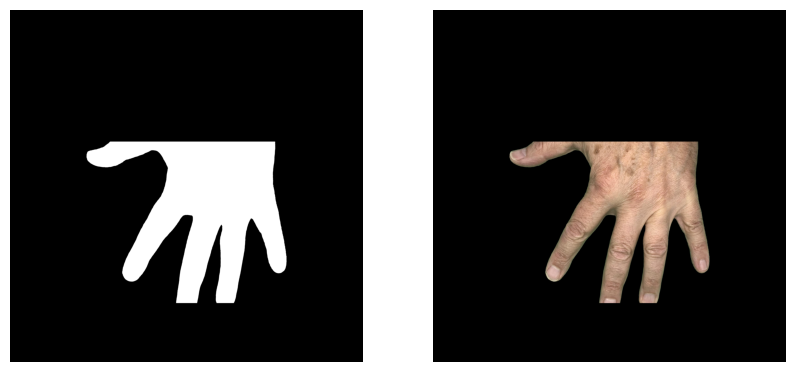

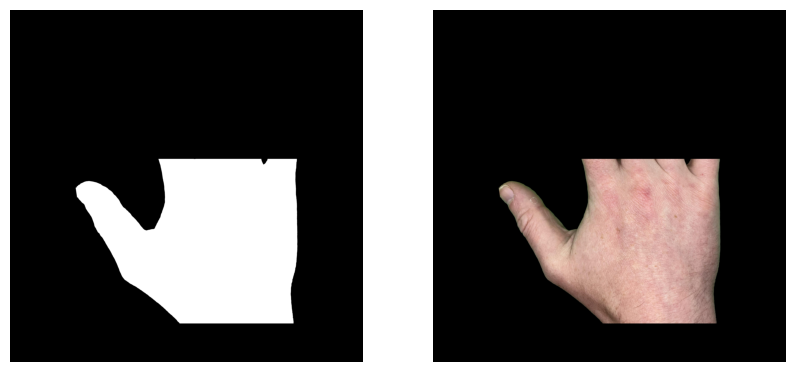

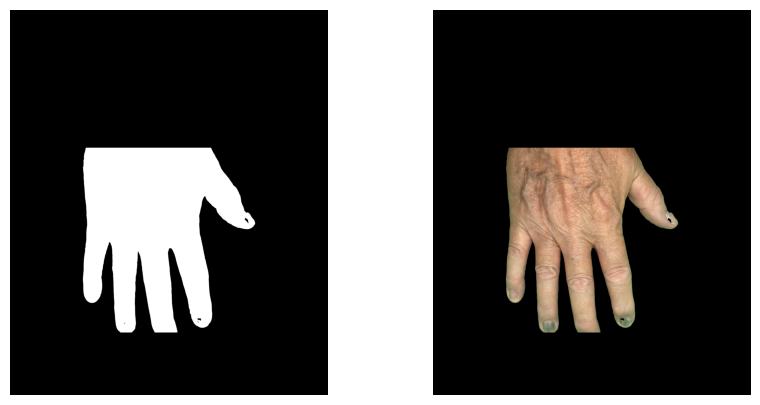

No significant convexity defects found. Using heuristic for finger-base line.


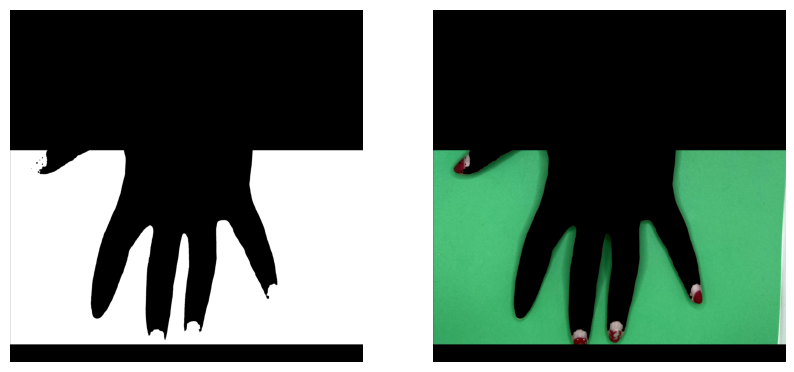

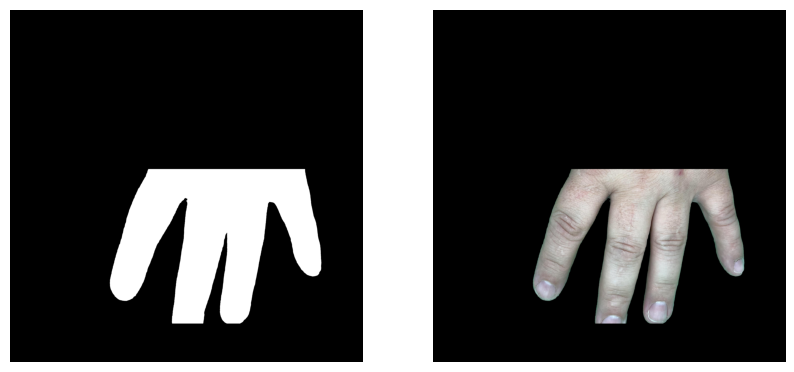

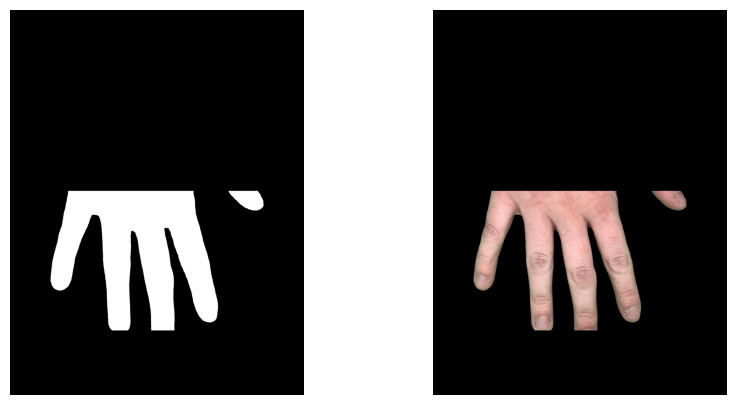

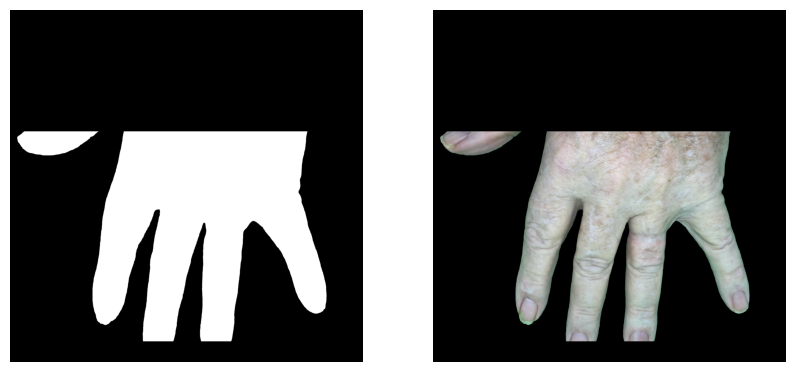

Not enough significant defects found for precise finger-base line. Using heuristic.


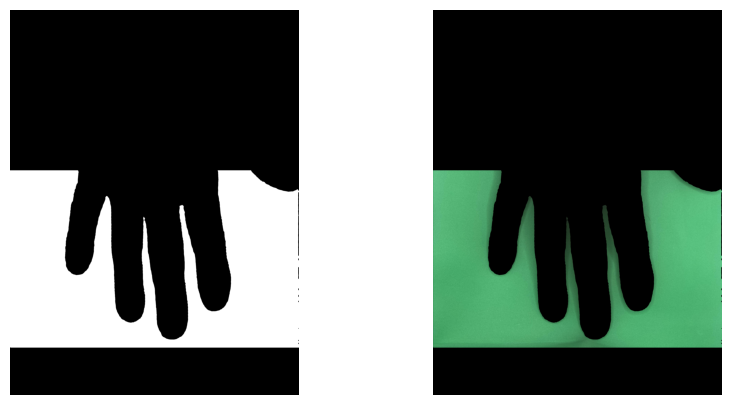

Not enough significant defects found for precise finger-base line. Using heuristic.


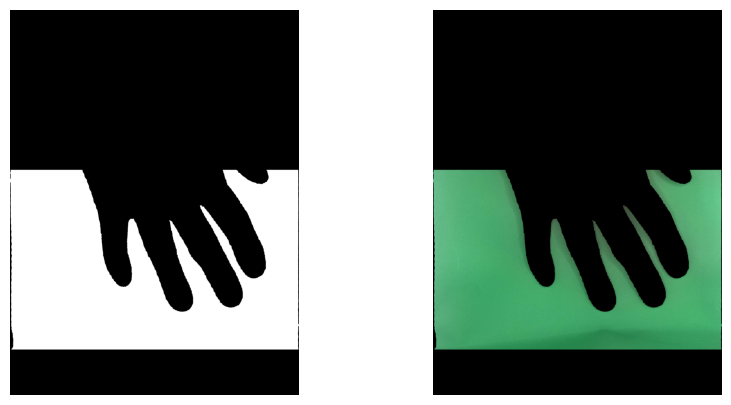

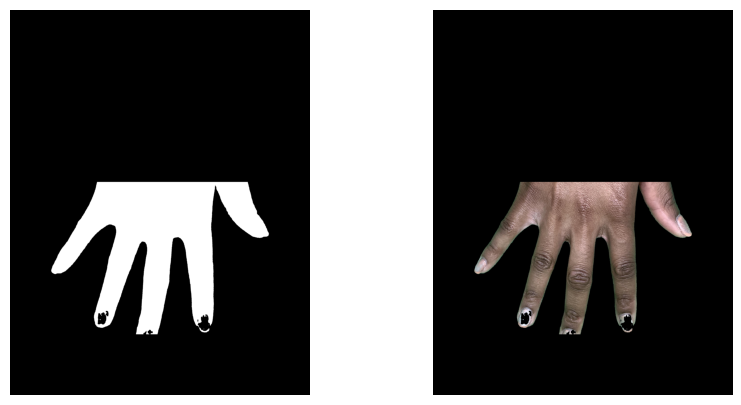

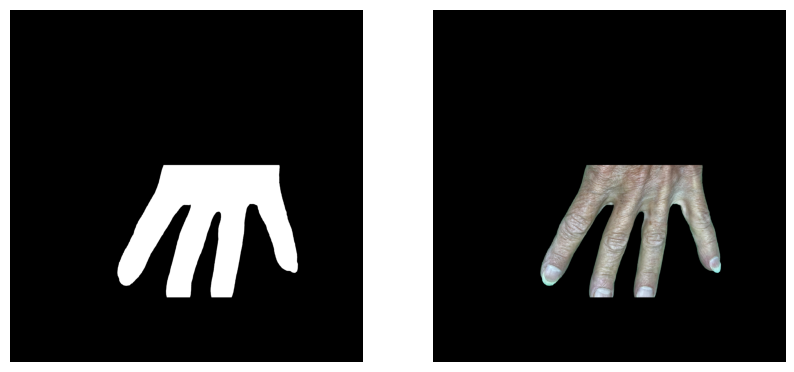

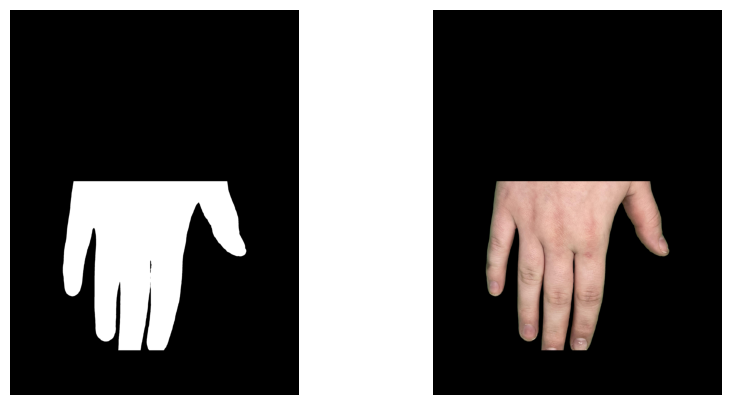

KeyboardInterrupt: 

: 

In [ ]:
completed = []
incomplete = []

for npy_file in os.listdir(root + segmentation_folder):
    image_file = npy_file.split('.')[0]
    if image_file in [
        "2c4bbea2-b78e-4379-9a5c-76d195ed8574", 
        "3aba178e-bd26-488b-94d5-4159a5339e66",
        ".DS_Store"
        ]:
        continue

    image_path = image_file + '.jpeg'  # Adjust if necessary
    read_path = os.path.join(root+image_folder, image_path)
    image = cv.imread(read_path)
    if image is None:
        print(f"Image not found: {read_path}")
        incomplete.append(image_file)
        continue
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    
    mask = read_segmentation(npy_file)  # Should be 2D, 0/1
    m = (mask*255).astype(np.uint8)
    m = np.ascontiguousarray(m)
    
    contours, _ = cv.findContours(m, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if not contours:
        print(f"No contours found for {image_file}.")
        incomplete.append(image_file)
        continue
    largest_contour = max(contours, key=cv.contourArea)

    # Straighten and rotate the hand to upright
    rotated_image, rotated_mask = straighten_rotated_image(image, m, largest_contour)

    contours, _ = cv.findContours(rotated_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    rotated_contour = max(contours, key=cv.contourArea)

    # Extract dorsal palm region using convexity defects and fallback
    dorsal_region_extracted, final_dorsal_mask = geometric_convex_defects(rotated_contour, rotated_mask, rotated_image)

    if dorsal_region_extracted is not None:
        figure, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(final_dorsal_mask, cmap='gray')
        ax[1].imshow(dorsal_region_extracted)
        for a in ax: a.axis('off')
        plt.show()
        output_path = os.path.join('../data/processed/cropped_dorsals-2', image_path)
        cv.imwrite(output_path, cv.cvtColor(dorsal_region_extracted, cv.COLOR_RGB2BGR))
        completed.append(image_file)
    else:
        print(f"No dorsal hand region detected in {image_file}.")
        incomplete.append(image_file)

In [ ]:
# image_file = 'f662d0e8-af3e-46ff-b7c4-7a6f3a9a4cda.png'
# image = cv.imread(root + '/' +image_file)

# mask = np.zeros_like(image)

# # copy your image_mask to all dimensions (i.e. colors) of your image
# for i in range(3): 
#     mask[:,:,i] = segmentations[image_file]
    
# plt.imshow(image[mask])

[ WARN:0@5363.130] global loadsave.cpp:268 findDecoder imread_('/Users/ntin/Documents/DermaML_local/hawkeye-hands-2024-07-29/f662d0e8-af3e-46ff-b7c4-7a6f3a9a4cda.png'): can't open/read file: check file path/integrity


KeyError: 'f662d0e8-af3e-46ff-b7c4-7a6f3a9a4cda.png'